## Proyecto Final - Maximiliano Ramirez - Entrenamiento y optimización de modelos de machine learning

#Abstracto

El proyecto busca generar un modelo de interpretación de datos de terremotos, estos entendidos como movimientos sismicos de magnitudes significativas y que podrian provocar daños. La motivación radica en la busqueda de patrones o tendencias que permitan establecer niveles de riesgo geológicos y temporales. Estos niveles de riesgo pueden ayudar a programas de prevención y educación sísmica, e incluso a organismos de emergencia, tanto para actividades preventivas como formativas.

El objetivo es identificar las variables fisicas que juegan un rol preponderante en la magnitud de un terremoto. Sean estas la profundidad, latitud y longitud geograficas, entre otras que se registran.

En primer lugar se emplean modelos de machine learning para mejorar la calidad de la base de datos, para luego emplear un modelo de clasificación sobre la data.

*La data es obtenida a traves de la plataforma kaggle, y se titula Significant Earquakes 1965-2016, representa una versión actualizada de la data utilizada en la entrega anterior, ya que incluye una mayor fracción de movimientos de caracter significativo.*

(https://www.kaggle.com/datasets/usgs/earthquake-database)

#Adquisición y preparación de datos
Se emplea una base de datos ya filtrada con terremotos con magnitudes relevantes.

In [1]:
#Importación de librerias
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import folium
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder

In [2]:
#Carga de archivo
url = 'https://drive.google.com/file/d/1o-4Yk2xO4dG0RQ8Ih9nCiqKWSUJB9LhQ/view?usp=share_link'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
df = pd.read_csv(path)

In [3]:
#Información de las columnas de la base de datos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23412 entries, 0 to 23411
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Date                        23412 non-null  object 
 1   Time                        23412 non-null  object 
 2   Latitude                    23412 non-null  float64
 3   Longitude                   23412 non-null  float64
 4   Type                        23412 non-null  object 
 5   Depth                       23412 non-null  float64
 6   Depth Error                 4461 non-null   float64
 7   Depth Seismic Stations      7097 non-null   float64
 8   Magnitude                   23412 non-null  float64
 9   Magnitude Type              23409 non-null  object 
 10  Magnitude Error             327 non-null    float64
 11  Magnitude Seismic Stations  2564 non-null   float64
 12  Azimuthal Gap               7299 non-null   float64
 13  Horizontal Distance         160

In [4]:
df.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [5]:
df.tail()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
23407,12/28/2016,08:22:12,38.3917,-118.8941,Earthquake,12.30,1.2,40.0,5.6,ML,...,18.0,42.47,0.120,NaN,0.1898,NN00570710,NN,NN,NN,Reviewed
23408,12/28/2016,09:13:47,38.3777,-118.8957,Earthquake,8.80,2.0,33.0,5.5,ML,...,18.0,48.58,0.129,NaN,0.2187,NN00570744,NN,NN,NN,Reviewed
23409,12/28/2016,12:38:51,36.9179,140.4262,Earthquake,10.00,1.8,NaN,5.9,MWW,...,NaN,91.00,0.992,4.8,1.5200,US10007NAF,US,US,US,Reviewed
23410,12/29/2016,22:30:19,-9.0283,118.6639,Earthquake,79.00,1.8,NaN,6.3,MWW,...,NaN,26.00,3.553,6.0,1.4300,US10007NL0,US,US,US,Reviewed
23411,12/30/2016,20:08:28,37.3973,141.4103,Earthquake,11.94,2.2,NaN,5.5,MB,...,428.0,97.00,0.681,4.5,0.9100,US10007NTD,US,US,US,Reviewed


In [6]:
#resumen estadístico de los datos
df.describe()

,Latitude,Longitude,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square
count,23412.000000,23412.000000,23412.000000,4461.000000,7097.000000,23412.000000,327.000000,2564.000000,7299.000000,1604.000000,1156.000000,17352.000000
mean,1.679033,39.639961,70.767911,4.993115,275.364098,5.882531,0.071820,48.944618,44.163532,3.992660,7.662759,1.022784
std,30.113183,125.511959,122.651898,4.875184,162.141631,0.423066,0.051466,62.943106,32.141486,5.377262,10.430396,0.188545
min,-77.080000,-179.997000,-1.100000,0.000000,0.000000,5.500000,0.000000,0.000000,0.000000,0.004505,0.085000,0.000000
25%,-18.653000,-76.349750,14.522500,1.800000,146.000000,5.600000,0.046000,10.000000,24.100000,0.968750,5.300000,0.900000
50%,-3.568500,103.982000,33.000000,3.500000,255.000000,5.700000,0.059000,28.000000,36.000000,2.319500,6.700000,1.000000
75%,26.190750,145.026250,54.000000,6.300000,384.000000,6.000000,0.075500,66.000000,54.000000,4.724500,8.100000,1.130000
max,86.005000,179.998000,700.000000,91.295000,934.000000,9.100000,0.410000,821.000000,360.000000,37.874000,99.000000,3.440000


In [7]:
# Identificamos los datos distintos en cada columna del tipo Object
for col in df.select_dtypes(include = ["object"]).columns:
    print(f"{col}: {df[col].unique()}")

Date: ['01/02/1965' '01/04/1965' '01/05/1965' ... '12/28/2016' '12/29/2016'
 '12/30/2016']
Time: ['13:44:18' '11:29:49' '18:05:58' ... '12:38:51' '22:30:19' '20:08:28']
Type: ['Earthquake' 'Nuclear Explosion' 'Explosion' 'Rock Burst']
Magnitude Type: ['MW' 'ML' 'MH' 'MS' 'MB' 'MWC' 'MD' nan 'MWB' 'MWW' 'MWR']
ID: ['ISCGEM860706' 'ISCGEM860737' 'ISCGEM860762' ... 'US10007NAF'
 'US10007NL0' 'US10007NTD']
Source: ['ISCGEM' 'ISCGEMSUP' 'OFFICIAL' 'CI' 'US' 'NC' 'GCMT' 'UW' 'ATLAS' 'NN'
 'SE' 'AK' 'PR']
Location Source: ['ISCGEM' 'CI' 'US' 'H' 'U' 'G' 'NC' 'B' 'GCMT' 'AG' 'UW' 'SPE' 'HVO'
 'BRK' 'ATLAS' 'AGS' 'PGC' 'BOU' 'SLC' 'OTT' 'AEI' 'AEIC' 'CASC' 'ISK'
 'ATH' 'THE' 'ROM' 'MDD' 'WEL' 'GUC' 'UNM' 'CSEM' 'RSPR' 'JMA' 'NN' 'CAR'
 'SJA' 'TEH' 'BEO' 'UCR' 'SE' 'TUL' 'TAP' 'THR' 'LIM' 'US_WEL' 'AK' 'PR']
Magnitude Source: ['ISCGEM' 'OFFICIAL' 'CI' 'US' '1020' 'BRK' 'NC' '1000' 'GCMT' '1009' 'UW'
 '1023' 'ATLAS' 'HRV' 'PAR' 'NIED' 'NN' 'SE' 'PGC' 'US_GCMT' 'US_PGC' 'AK'
 'PR' 'GUC']
Status: [

In [8]:
#revisamos la proporcion de tipos dentro de la variable "Type"
Type_counts = df.Type.value_counts(normalize = True)
Type_counts

Earthquake           0.992312
Nuclear Explosion    0.007475
Explosion            0.000171
Rock Burst           0.000043
Name: Type, dtype: float64

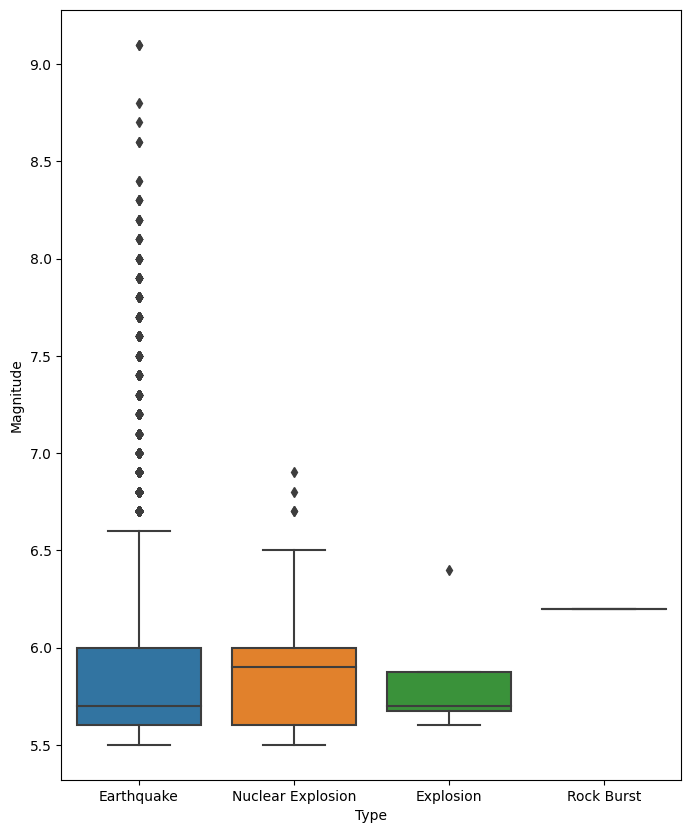

In [9]:
#Empleamos un Boxplot para revisar la distribución de la variable Type en base a las magnitudes
plt.figure(figsize=(8,10))
sns.boxplot(data = df, y = 'Magnitude', x = 'Type')
plt.show()

In [26]:
#Solo nos enfocamos en los terremotos, creamos una copia del dataset limpio
df_2 = df[df['Type']=='Earthquake'].copy()

In [27]:
#revisamos la cantidad de nulos
df_2.isnull().sum()

Date                              0
Time                              0
Latitude                          0
Longitude                         0
Type                              0
Depth                             0
Depth Error                   18783
Depth Seismic Stations        16148
Magnitude                         0
Magnitude Type                    3
Magnitude Error               22917
Magnitude Seismic Stations    20772
Azimuthal Gap                 15946
Horizontal Distance           21637
Horizontal Error              22088
Root Mean Square               5985
ID                                0
Source                            0
Location Source                   0
Magnitude Source                  0
Status                            0
dtype: int64

In [28]:
#Renombramos las columnas
df_2.rename(columns = {'Depth Error':'q_dep_e','Depth Seismic Stations':'q_dep_s',
                     'Magnitude Type':'Mag_t','Magnitude Error':'q_mag_e',
                     'Magnitude Seismic Stations':'q_mag_s',
                     'Azimuthal Gap':'q_az_g','Horizontal Distance':'q_hor_d',
                     'Horizontal Error':'q_hor_e','Root Mean Square':'q_rms',
                     'Location Source':'Loc_s','Magnitude Source':'Mag_source'}
          , inplace = True)

In [32]:
#convertimos la variable "Date" y luego revisamos las fechas y magnitudes que comprende el dataset
df_2["Year"] = pd.to_datetime(df_2['Date'], utc = True).dt.year
print("Years from:", min(df_2['Year']), " to:", max(df_2['Year']))
print("Magnitude from:", min(df_2['Magnitude']), " to:", max(df_2['Magnitude']))

Years from: 1965  to: 2016
Magnitude from: 5.5  to: 9.1


# Análisis exploratorio de datos (EDA)
Al observar la data graficada sobre un mapa, obtendremos una imagen familiar, donde las zonas de alta actividad sísmica se hacen notar fuertemente. La ubicación de los terremotos está fuertemente asociada a las zonas de confluencia tectónica, caracterizadas por su alta actividad. Fuera de estas zonas la actividad decae fuertemente.

Por otra parte, la profundidad juega un rol clave, que se alcanza a apreciar cuando se contrasta con la magnitud. Es así como se remueven del dataset algunas variables que no aportan y se entrega mayor información sobre la relacion del resto de variables del dataset.

In [29]:
#se define un tamaño de muestra para el grafico
limit = 300
df_incidents = df_2.iloc[0:limit, :]

In [30]:
#gráfico mapa-mundo
world_map = folium.Map()

incidents = folium.map.FeatureGroup()
# loop atraves de incidentes (Latitude, Longitude)
for lat, lng, in zip(df_incidents.Latitude, df_incidents.Longitude):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # tamaño del circulo
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# añadir texto a las etiquetas
latitudes = list(df_incidents.Latitude)
longitudes = list(df_incidents.Longitude)
labels = list(df_incidents.Type)

for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup=label).add_to(world_map)

# añadir al mapa-mundo
world_map.add_child(incidents)

<Axes: xlabel='Depth', ylabel='Magnitude'>

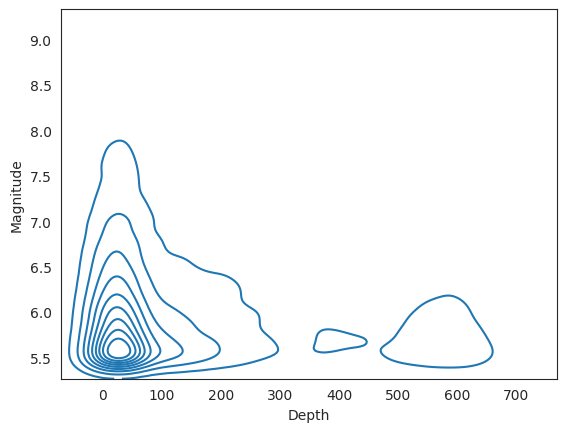

In [31]:
#Grafico KDE (Kernel density estimate)
sns.kdeplot(data = df_2 , x="Depth", y="Magnitude")

In [33]:
#Coeficientes de correlación entre las variables de la base de datos
df_2.corr()

<ipython-input-33-703aefbb9758>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_2.corr()


,Latitude,Longitude,Depth,q_dep_e,q_dep_s,Magnitude,q_mag_e,q_mag_s,q_az_g,q_hor_d,q_hor_e,q_rms,Year
Latitude,1.000000,0.202677,-0.076290,-0.012784,0.438414,0.034615,-0.030944,0.291270,0.038636,-0.395453,-0.218702,-0.213346,-0.068768
Longitude,0.202677,1.000000,-0.086624,0.042013,0.012721,0.037433,-0.137488,0.136157,-0.228421,-0.134680,0.001797,-0.028343,-0.038421
Depth,-0.076290,-0.086624,1.000000,-0.068654,0.173686,0.023222,-0.041710,-0.004240,-0.172193,-0.075213,0.064871,-0.137930,-0.027528
q_dep_e,-0.012784,0.042013,-0.068654,1.000000,-0.295481,-0.135597,0.372680,-0.071189,0.274018,-0.071166,0.232450,0.097543,-0.153554
q_dep_s,0.438414,0.012721,0.173686,-0.295481,1.000000,0.440356,-0.371709,0.810718,-0.419063,0.213721,-0.128924,-0.161474,0.242079
Magnitude,0.034615,0.037433,0.023222,-0.135597,0.440356,1.000000,0.171403,-0.029233,-0.237080,-0.094302,-0.067213,0.077234,-0.032649
q_mag_e,-0.030944,-0.137488,-0.041710,0.372680,-0.371709,0.171403,1.000000,-0.353330,0.348455,-0.023219,0.040480,-0.172998,-0.325631
q_mag_s,0.291270,0.136157,-0.004240,-0.071189,0.810718,-0.029233,-0.353330,1.000000,-0.325111,-0.124504,0.004963,-0.165589,0.425278
q_az_g,0.038636,-0.228421,-0.172193,0.274018,-0.419063,-0.237080,0.348455,-0.325111,1.000000,-0.022447,0.074695,-0.063021,-0.331755
q_hor_d,-0.395453,-0.134680,-0.075213,-0.071166,0.213721,-0.094302,-0.023219,-0.124504,-0.022447,1.000000,0.396335,0.040576,0.106742


<ipython-input-34-cec9bc85f675>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.zeros_like(df_2.corr())
<ipython-input-34-cec9bc85f675>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_2.corr(), mask=mask, annot=True, annot_kws={"size": 14})


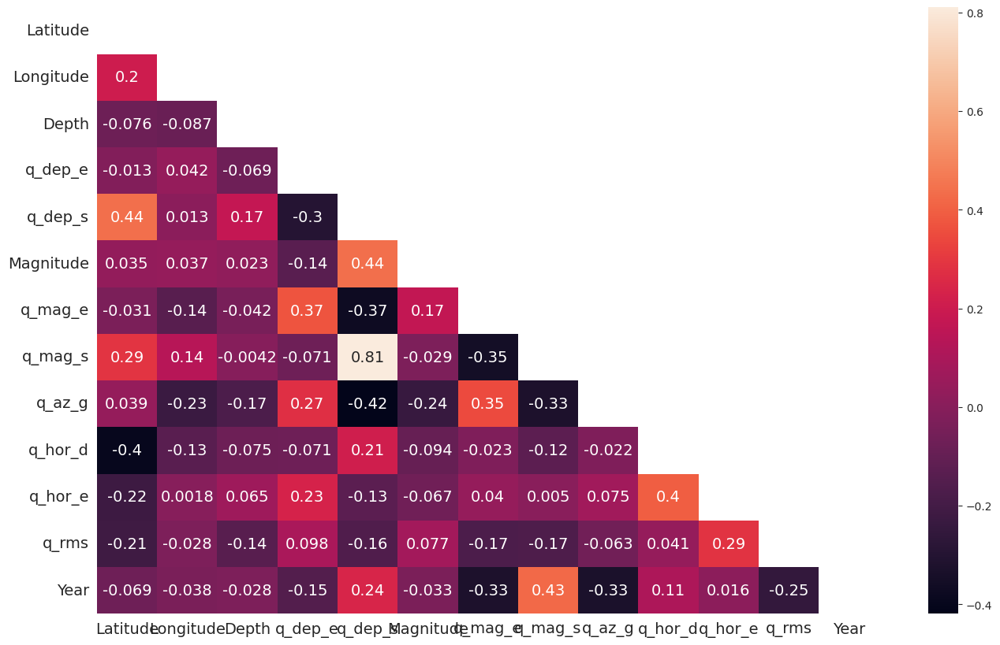

In [34]:
#mapa de calor con las correlaciones
mask = np.zeros_like(df_2.corr())
triangle_indices = np.triu_indices_from(mask)
mask[triangle_indices] = True
mask

plt.figure(figsize=(16,10))
sns.heatmap(df_2.corr(), mask=mask, annot=True, annot_kws={"size": 14})
sns.set_style('white')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [20]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     - 22.6 MB 21.4 MB/s 0:00:02
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 24.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 33.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 95.4 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=357350 sha256=9b5782ee2309465258d44406bf49c06ff289b123dbf35ce6359bf6d0242ee957
  Stored in directory: /tmp/pip-ephem-wheel-cache-qs1_uasd/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=c79dc2e8a2ccf257086db30cc3989b5537d7fe0ae25dd3145ceca77c26b830d2
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
S

In [21]:
import pandas_profiling

<ipython-input-21-6a00893fb3e1>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [35]:
# Eliminamos las columnas que no que aportarian nada al modelo
df_2.drop(["Date", "Time", "ID", "Status", "Type"],
        axis = 1, inplace = True)
df_2.head()

,Latitude,Longitude,Depth,q_dep_e,q_dep_s,Magnitude,Mag_t,q_mag_e,q_mag_s,q_az_g,q_hor_d,q_hor_e,q_rms,Source,Loc_s,Mag_source,Year
0,19.246,145.616,131.6,NaN,NaN,6.0,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965
1,1.863,127.352,80.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965
2,-20.579,-173.972,20.0,NaN,NaN,6.2,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965
3,-59.076,-23.557,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965
4,11.938,126.427,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965


In [36]:
#Data Profiling
profile = pandas_profiling.ProfileReport(df_2)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Modelo ML para completar el dataset
Primero se identifica como variable objetivo el tipo de magnitud registrada, para luego emplear modelos de machine learning, comparando sus resultados. Para esto se compara el modelo RandomForest contra Árbol de desición y regresión logística.

In [37]:
#Revisión de datos incosistentes en la variable de interés "Mag_t"
Magnitude_type_nan = df_2[df_2['Mag_t'].isnull()]
Magnitude_type_nan

,Latitude,Longitude,Depth,q_dep_e,q_dep_s,Magnitude,Mag_t,q_mag_e,q_mag_s,q_az_g,q_hor_d,q_hor_e,q_rms,Source,Loc_s,Mag_source,Year
6703,40.3732,-124.9227,11.93,NaN,NaN,5.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ATLAS,ATLAS,ATLAS,1983
7294,37.4600,-118.5900,9.00,NaN,NaN,5.82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ATLAS,ATLAS,ATLAS,1984
7919,37.4788,-121.6858,9.17,NaN,NaN,5.60,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ATLAS,ATLAS,ATLAS,1986


In [38]:
#se eliminan las filas del modelo que tienen el valor NaN en Mag_t
df_3 = df_2.dropna(subset=["Mag_t"])
df_3.isnull().sum()

Latitude          0
Longitude         0
Depth             0
q_dep_e       18780
q_dep_s       16145
Magnitude         0
Mag_t             0
q_mag_e       22914
q_mag_s       20769
q_az_g        15943
q_hor_d       21634
q_hor_e       22085
q_rms          5982
Source            0
Loc_s             0
Mag_source        0
Year              0
dtype: int64

([<matplotlib.patches.Wedge at 0x780276866410>,
 [Text(0.5527033714745364, 0.9510620290815319, 'MW'),
  Text(-1.0552210036173537, 0.3106583871792051, 'MWC'),
  Text(-0.6251631498229219, -0.905080679333883, 'MB'),
  Text(0.2336335070389838, -1.0749024999453045, 'MWB'),
  Text(0.8002301064674736, -0.7547395422945959, 'MWW'),
  Text(1.0636553021636346, -0.28042360488943757, 'MS'),
  Text(1.0998056344374023, -0.02067768023118192, 'ML'),
  Text(1.0999768214910146, -0.007140881074830134, 'MWR'),
  Text(1.0999974245651472, -0.0023803256170746166, 'MD'),
  Text(1.0999997484806272, -0.0007438699867632481, 'MH')])

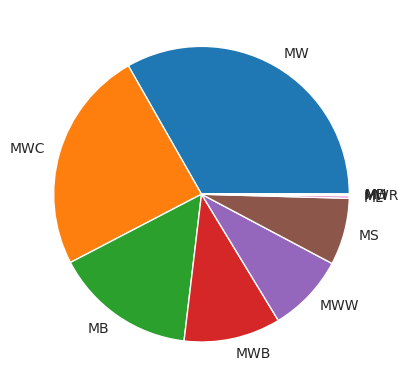

In [39]:
#graficamos la distribución de la variable de interes "Mag_t"
fig, ax = plt.subplots()
s = df_3['Mag_t'].value_counts()
plt.pie(s,labels = s.index)

In [171]:
#Separo las variables categoricas de las numerica, se consideran cuatro de estas ultimas dado que maximiza los resultados de los modelos predictivos
X_cat = df_3[['Loc_s', 'Mag_source', 'Source']]
X_num = df_3[['Magnitude','Depth','Latitude','Longitude']]

In [172]:
#Se define la variable "y"
y = df_3['Mag_t']

In [173]:
#Importamos en encoder, y hacemos Fit con el modelo
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()
X_cat = ohe.fit_transform(X_cat).toarray()

In [174]:
#configuramos el dataframe y vemos el resultado
X_cat = pd.DataFrame(X_cat)
X_cat

,0,1,2,3,4,5,6,7,8,9,...,72,73,74,75,76,77,78,79,80,81
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23224,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
23225,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
23226,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
23227,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [175]:
#Se importa y define el objeto
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [176]:
#Se hace fit en el modelo de regresión
X_num = scaler.fit_transform(X_num)
X_num = pd.DataFrame(X_num)
X_num

,0,1,2,3
0,0.138889,0.189274,0.590649,0.904493
1,0.083333,0.115675,0.484060,0.853759
2,0.194444,0.030096,0.346451,0.016736
3,0.083333,0.022964,0.110396,0.434562
4,0.083333,0.022964,0.545838,0.851190
...,...,...,...,...
23224,0.027778,0.019113,0.708046,0.169733
23225,0.000000,0.014121,0.707960,0.169728
23226,0.111111,0.015832,0.699009,0.890077
23227,0.222222,0.114249,0.417277,0.829625


In [177]:
#Se concatenan ambas tablas, de variables categoricas y numericas
X_all = pd.concat([X_cat, X_num], axis = 1)
X_all

,0,1,2,3,4,5,6,7,8,9,...,76,77,78,79,80,81,0,1,2,3
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.138889,0.189274,0.590649,0.904493
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.115675,0.484060,0.853759
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.194444,0.030096,0.346451,0.016736
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.022964,0.110396,0.434562
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.022964,0.545838,0.851190
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23224,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.027778,0.019113,0.708046,0.169733
23225,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.014121,0.707960,0.169728
23226,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.111111,0.015832,0.699009,0.890077
23227,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.222222,0.114249,0.417277,0.829625


In [178]:
#Se realiza la división en conjunto de entrenamiento y de prueba
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
X_train, X_test, y_train, y_test = train_test_split(X_all, y, test_size = 0.30, stratify = y)

In [179]:
#importación y "fit"
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(random_state=42, n_estimators=100,
                               class_weight="balanced", max_features="log2")
model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_features='log2',
                       random_state=42)

In [180]:
#test predictivo
y_pred_1 = model.predict(X_test)

In [181]:
#Creación del reporte
cr_1 = classification_report(y_test, y_pred_1)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [182]:
#Resumen de indicadores del modelo
print(cr_1)

              precision    recall  f1-score   support

          MB       0.57      0.68      0.62      1078
          MD       1.00      1.00      1.00         2
          MH       0.00      0.00      0.00         1
          ML       0.75      0.60      0.67        20
          MS       0.46      0.43      0.45       511
          MW       0.78      0.83      0.81      2317
         MWB       0.36      0.34      0.35       737
         MWC       0.70      0.61      0.65      1700
         MWR       1.00      0.25      0.40         8
         MWW       0.38      0.34      0.36       595

    accuracy                           0.63      6969
   macro avg       0.60      0.51      0.53      6969
weighted avg       0.63      0.63      0.63      6969



In [84]:
#importación y "fit" Regresión logística
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [85]:
#test predictivo
y_pred_2 = model.predict(X_test)

In [86]:
#Creación del reporte
cr_2 = classification_report(y_test, y_pred_2)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [87]:
#Resumen de indicadores del modelo
print(cr_2)

              precision    recall  f1-score   support

          MB       0.47      0.87      0.61      1078
          MD       1.00      1.00      1.00         2
          MH       0.00      0.00      0.00         1
          ML       0.55      0.90      0.68        20
          MS       0.13      0.08      0.10       511
          MW       0.68      0.99      0.81      2317
         MWB       0.31      0.24      0.27       737
         MWC       0.99      0.27      0.43      1700
         MWR       1.00      0.12      0.22         8
         MWW       0.25      0.10      0.14       595

    accuracy                           0.57      6969
   macro avg       0.54      0.46      0.43      6969
weighted avg       0.61      0.57      0.52      6969



In [88]:
#importación y "fit" Arbol de desición
from sklearn.tree import DecisionTreeClassifier
arbol_de_decision = DecisionTreeClassifier(max_depth=6, random_state = 42)
arbol_de_decision.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=6, random_state=42)

In [89]:
#test predictivo
y_pred_3 = model.predict(X_test)

In [90]:
#Creación del reporte
cr_3 = classification_report(y_test, y_pred_3)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [91]:
#Resumen de indicadores del modelo
print(cr_3)

              precision    recall  f1-score   support

          MB       0.47      0.87      0.61      1078
          MD       1.00      1.00      1.00         2
          MH       0.00      0.00      0.00         1
          ML       0.55      0.90      0.68        20
          MS       0.13      0.08      0.10       511
          MW       0.68      0.99      0.81      2317
         MWB       0.31      0.24      0.27       737
         MWC       0.99      0.27      0.43      1700
         MWR       1.00      0.12      0.22         8
         MWW       0.25      0.10      0.14       595

    accuracy                           0.57      6969
   macro avg       0.54      0.46      0.43      6969
weighted avg       0.61      0.57      0.52      6969



# Análisis de clusters, mediante k-means
Mediante un modelo de clasificación es posible identificar una serie de clusters de interés para el estudio, que para el caso de los terremotos nos interesa separarlos en regiones geograficas de ineres (mayor a 2).

In [92]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import davies_bouldin_score,silhouette_score,silhouette_samples,calinski_harabasz_score

In [186]:
X_num = df_2[['Magnitude','Depth','Latitude','Longitude']]

In [187]:
#Normalizamos los datos
X_num = preprocessing.normalize(X_num)
X_num

array([[ 0.03040988,  0.66699001,  0.09754476,  0.73802749],
       [ 0.03853362,  0.53149819,  0.01237726,  0.84609198],
       [ 0.03514105,  0.11335823, -0.11663995, -0.98605788],
       ...,
       [ 0.04050488,  0.06865234,  0.25345003,  0.96405876],
       [ 0.04406206,  0.55252428, -0.06314373,  0.82993273],
       [ 0.0374503 ,  0.08130119,  0.25464365,  0.96288328]])

In [103]:
#creamos una copia del dataframe
X = X_num.copy()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

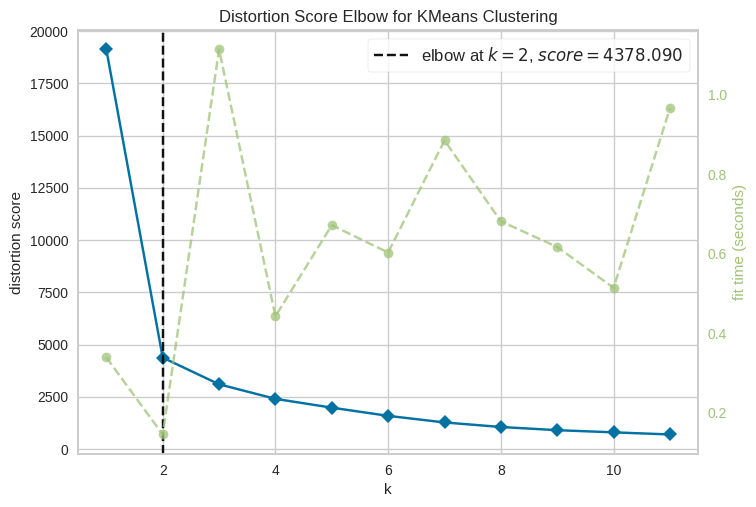

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [104]:
#metodo del codo para obtención de clusteres
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,12))
visualizer.fit(X)        # Entrenamos con los datos
visualizer.show()        # Renderizamos la imagen

In [105]:
# diccionarios vacios para ser almacenados los resultados
sse,db,slc,cal = {}, {}, {}, {}
for k in range(2, 10):
    # semilla de 10 para asegurar reproducibilidad
    kmeans = KMeans(n_clusters=k, max_iter=1000,random_state=10).fit(X) # Algoritmo K means
    if k == 3: labels = kmeans.labels_
    clusters = kmeans.labels_ # Extraccion de labels
    sse[k] = kmeans.inertia_ # Inercia: Suma de las distancias de las muestras a su centroide mas cercano
    db[k] = davies_bouldin_score(X,clusters) # Calculo del indice de Davies Bouldin
    slc[k] = silhouette_score(X,clusters) # Calculo del indice de Silhouette
    cal[k] = calinski_harabasz_score(X,clusters) # Calculo del indice de Calinski-Harabasz

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

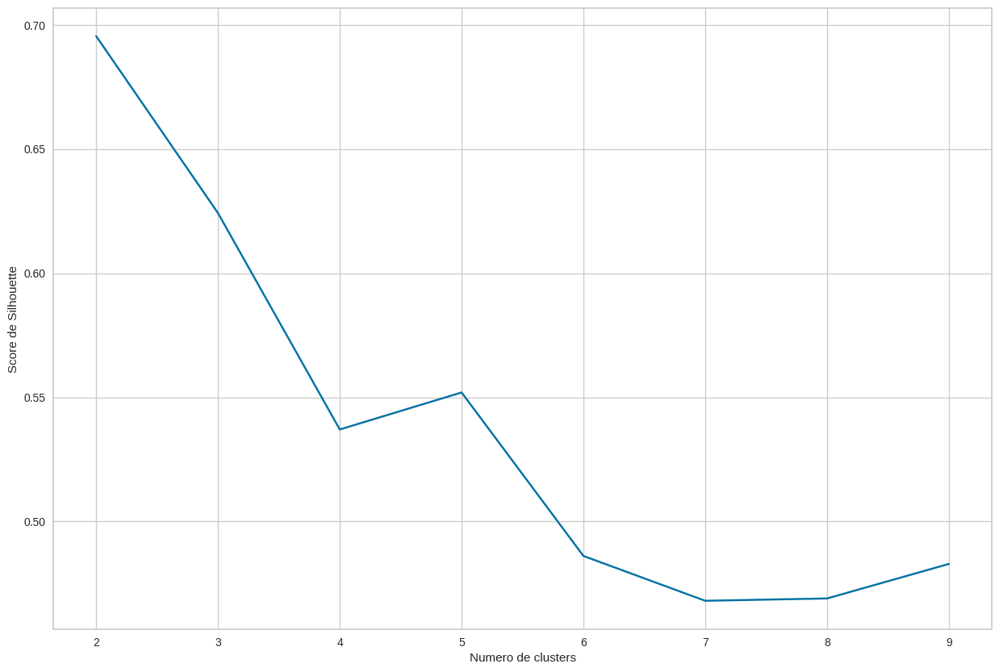

In [106]:
plt.figure(figsize=(15,10))
plt.plot(list(slc.keys()), list(slc.values()))
plt.xlabel("Numero de clusters")
plt.ylabel("Score de Silhouette")
plt.show()

In [107]:
#fit del algoritmo
kmeans = KMeans(n_clusters=5, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X)

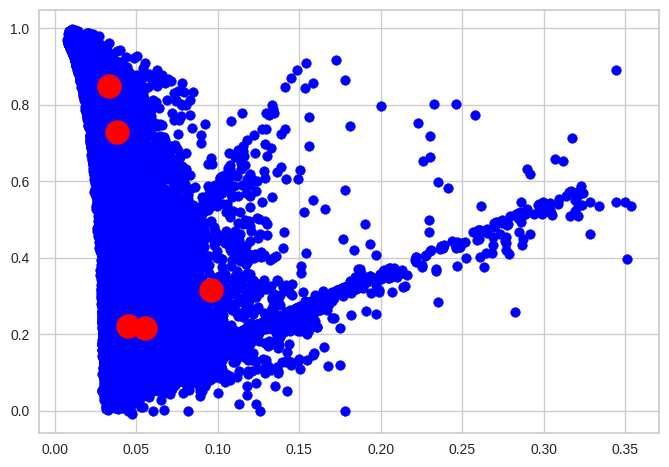

In [108]:
#diagrama de distribución
plt.scatter(X[:,0], X[:,1], c='blue')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
plt.show()

In [109]:
df_2['grupo'] = pred_y
df_2

,Latitude,Longitude,Depth,q_dep_e,q_dep_s,Magnitude,Mag_t,q_mag_e,q_mag_s,q_az_g,q_hor_d,q_hor_e,q_rms,Source,Loc_s,Mag_source,Year,grupo
0,19.2460,145.6160,131.60,NaN,NaN,6.0,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965,3
1,1.8630,127.3520,80.00,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965,0
2,-20.5790,-173.9720,20.00,NaN,NaN,6.2,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965,1
3,-59.0760,-23.5570,15.00,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965,4
4,11.9380,126.4270,15.00,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM,ISCGEM,ISCGEM,1965,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23407,38.3917,-118.8941,12.30,1.2,40.0,5.6,ML,0.320,18.0,42.47,0.120,NaN,0.1898,NN,NN,NN,2016,1
23408,38.3777,-118.8957,8.80,2.0,33.0,5.5,ML,0.260,18.0,48.58,0.129,NaN,0.2187,NN,NN,NN,2016,1
23409,36.9179,140.4262,10.00,1.8,NaN,5.9,MWW,NaN,NaN,91.00,0.992,4.8,1.5200,US,US,US,2016,0
23410,-9.0283,118.6639,79.00,1.8,NaN,6.3,MWW,NaN,NaN,26.00,3.553,6.0,1.4300,US,US,US,2016,0


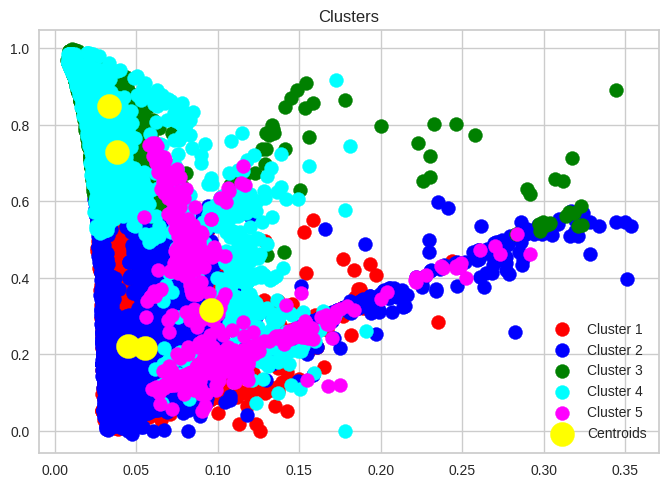

In [110]:
# Visualizacion grafica de los clusters
plt.scatter(X[pred_y == 0, 0], X[pred_y == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X[pred_y == 1, 0], X[pred_y == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X[pred_y == 2, 0], X[pred_y == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X[pred_y == 3, 0], X[pred_y == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')
plt.scatter(X[pred_y == 4, 0], X[pred_y == 4, 1], s = 100, c = 'magenta', label = 'Cluster 5')
#plt.scatter(X[pred_y == 4, 0], X[pred_y == 4, 1], s = 100, c = 'black', label = 'Cluster 6')

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroids')

plt.title('Clusters')
plt.legend()
plt.show()

In [111]:
df_2.groupby(['grupo']).max()

<ipython-input-111-5a4b03c88933>:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  df_2.groupby(['grupo']).max()


,Latitude,Longitude,Depth,q_dep_e,q_dep_s,Magnitude,q_mag_e,q_mag_s,q_az_g,q_hor_d,q_hor_e,q_rms,Source,Loc_s,Mag_source,Year
grupo,,,,,,,,,,,,,,,,
0,85.735,179.989,122.0,43.700,929.0,9.1,0.169,821.0,211.0,22.210,12.1,1.70,US,WEL,US,2016
1,83.066,-10.540,139.1,91.295,882.0,8.8,0.350,483.0,360.0,37.874,99.0,3.22,UW,WEL,UW,2016
2,66.157,13.582,700.0,26.600,934.0,8.2,0.098,149.0,262.8,8.705,10.6,2.11,US,US,US,2016
3,86.005,179.998,691.6,21.000,862.0,8.3,0.116,191.0,115.0,8.780,10.9,1.50,US,WEL,US,2016
4,-10.329,35.379,73.0,25.000,453.0,7.7,0.130,84.0,113.7,22.560,11.8,1.78,US,US,US,2016


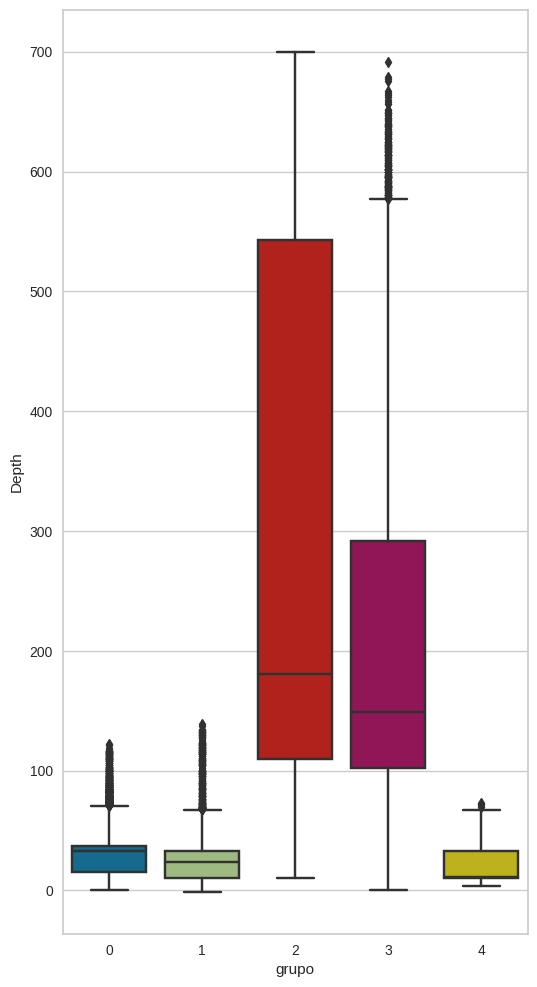

In [114]:
#Distribución de la variable "Depth" en base a la nueva variable , vía Boxplot
plt.figure(figsize=(6,12))
sns.boxplot(data = df_2, y = 'Depth', x = 'grupo')
plt.show()

<Axes: xlabel='Depth', ylabel='Magnitude'>

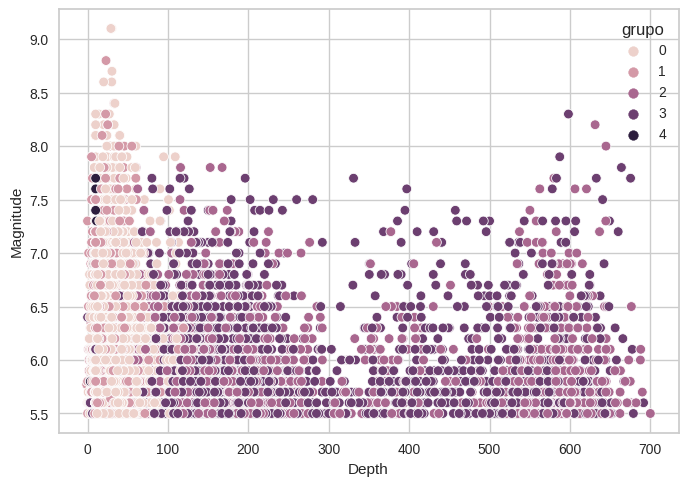

In [115]:
#Grafico de dispersión de profundidades y magnitudes de terremotos
sns.scatterplot(data=df_2, x="Depth", y="Magnitude",hue="grupo")

<Axes: xlabel='Longitude', ylabel='Latitude'>

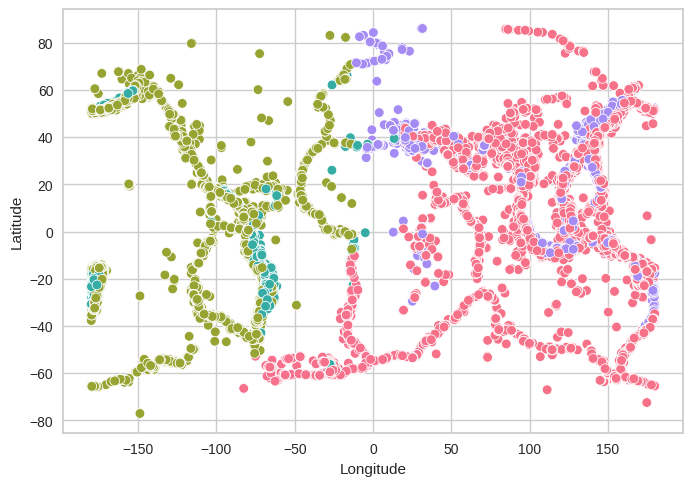

In [116]:
#Grafico de dispersión de profundidades y magnitudes de terremotos
sns.scatterplot(data=df_2, x="Longitude", y="Latitude",hue="grupo",palette='husl',sizes="Magnitude",legend=False)

# Optimización y validación
Con esta nueva información obtenida de los clusters, se realizarán diversos test tanto de validación (K-folds), hipertunning (RandomizedSearch), y obtención de indicadores para modelo Random Forest.

In [188]:
#definimos la nueva etiqueta de grupo como la variable objetivo
y = df_2['grupo']
X = X_num

In [147]:
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold, cross_val_score

In [189]:
#Creamos los validadores, el modelo de origen, y vemos los resultados
clf = DecisionTreeClassifier(random_state=42)
k_folds = KFold(n_splits = 5)
scores = cross_val_score(clf, X, y, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.99397461 0.99784807 0.99655618 0.99591046 0.99741713]
Average CV Score:  0.9963412904571115
Number of CV Scores used in Average:  5


In [156]:
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb

In [190]:
#se establece la data de prueba y entrenamiento
X_train,X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model= xgb.XGBClassifier(learning_rate=0.001)

In [191]:
#se establecen los parametros a optimizar
params_grid = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [5,6,7],
        'criterion':['entropy','gini']
        }

In [192]:
# Hipertunning
grid_cv = RandomizedSearchCV(model, params_grid, scoring="accuracy", n_jobs=-1, cv=3)
grid_cv.fit(X_train, y_train)

print("Mejores parametros", grid_cv.best_params_)
print("Mejor score de CV", grid_cv.best_score_)
print(f'Accuracy del modelo = {round(accuracy_score(y_test, grid_cv.predict(X_test)), 5)}')

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [03:28:34] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "criterion" } are not used.

  warnings.warn(smsg, UserWarning)


Mejores parametros {'subsample': 0.8, 'min_child_weight': 1, 'max_depth': 7, 'gamma': 2, 'criterion': 'gini', 'colsample_bytree': 1.0}
Mejor score de CV 0.9958184119749333
Accuracy del modelo = 0.99527


In [197]:
#entrenamos un modelo random forest
model = RandomForestClassifier(criterion="gini", max_depth= 7,
                              )
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=7)

In [199]:
#test predictivo
y_pred_4 = model.predict(X_test)

In [200]:
#Creación del reporte
cr_4 = classification_report(y_test, y_pred_4)

In [201]:
#Resumen de indicadores del modelo
print(cr_4)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3620
           1       1.00      1.00      1.00      1782
           2       0.99      1.00      0.99       541
           3       0.99      0.99      0.99       798
           4       1.00      1.00      1.00       229

    accuracy                           1.00      6970
   macro avg       1.00      1.00      1.00      6970
weighted avg       1.00      1.00      1.00      6970



In [202]:
#Evaluación del Modelo con mejores resultados (random Forest)
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_4))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_4))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_4)))

Mean Absolute Error: 0.008321377331420373
Mean Squared Error: 0.02295552367288379
Root Mean Squared Error: 0.15151080381571405
